#! pip install grad-cam timm

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from math import ceil
from time import time
from skimage import color
from tqdm.auto import tqdm
import multiprocessing as mp
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split

import timm
import torch
import torchvision
import torchsummary
from torch import nn
from torch.optim import Adam
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader
#from torch.utils.tensorboard import SummaryWriter

from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, EigenGradCAM, LayerCAM, FullGrad

import PAR

%matplotlib inline

In [2]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [3]:
par = PAR.PAR(num_iter=15, dilations=[1,2,4,8,16,32])

In [4]:
valid_img_path_1 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/436219-7159-48057-[1, 0, 0].png'
#valid_img_path_1 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/1222870-17531-5689-[0, 0, 1].png'
#valid_img_path_2 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/436219-22342-50847-[1, 1, 0].png'
valid_img_path_2 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/436219-9328-56427-[1, 1, 0].png'#436219-9328-53637-[1, 1, 0].png
valid_img_path_3 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/1003370-5631-18822-[0, 1, 0].png'
valid_img_path_4 = '/home/zephyr/Desktop/Newcastle_University/11_FP_D/Dataset/WSSS4LUAD/1.training/1.training/449636-23526-9666-[0, 0, 1].png'

In [5]:
valid_img_1 = cv2.resize(cv2.imread(valid_img_path_1), (224, 224))
valid_img_2 = cv2.resize(cv2.imread(valid_img_path_2), (224, 224))
valid_img_3 = cv2.resize(cv2.imread(valid_img_path_3), (224, 224))
valid_img_4 = cv2.resize(cv2.imread(valid_img_path_4), (224, 224))

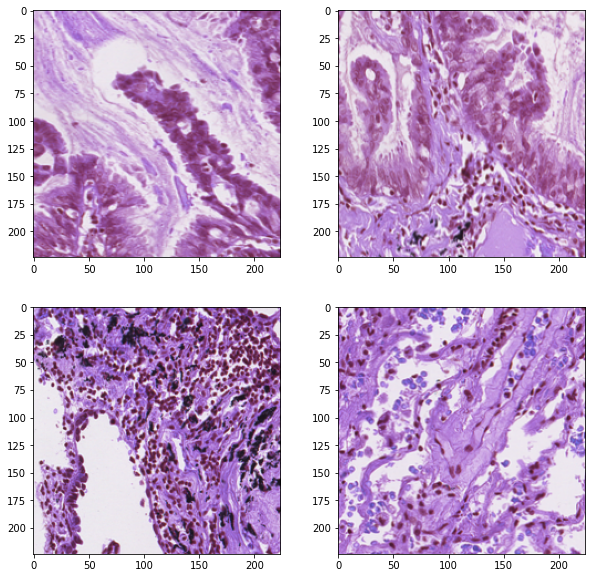

In [6]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(valid_img_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(valid_img_2)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(valid_img_3)

ax = fig.add_subplot(2, 2, 4)
plt.imshow(valid_img_4)

In [6]:
def preprocess_image(img: np.ndarray, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], resized = (224, 224)) -> torch.Tensor:
  
  preprocessing = transforms.Compose([
                                      transforms.ToTensor(),
                                      transforms.Resize((224, 224)),
                                      transforms.Normalize(mean, std),
                                      ])
  return preprocessing(img.copy()).unsqueeze(0)


In [7]:
def reshape_transform(tensor, height=7, width=7):
  result = tensor[:, 1 :  , :].reshape(tensor.size(0),
                                       height, width, tensor.size(2))
  
  # Bring the channels to the first dimension,
  # like in CNNs.
  result = result.transpose(2, 3).transpose(1, 2)
  return result

In [8]:
def mask_threshold(mask):
    v = np.concatenate(mask)
    t = v.mean()
    d = np.inf
    ds = 0.005
    while d > ds:
        g1 = v[v>t]
        g2 = v[v<=t]
        m1 = g1.mean()
        m2 = g2.mean()
        tp = (m1 + m2)/2
        d = np.abs(t - tp)
        t = tp
        #print(t)

    imt = mask > t

    return imt

model_weights = ['/home/zephyr/Desktop/Newcastle_University/11_FP_D/Models/' + x for
                 x in os.listdir('/home/zephyr/Desktop/Newcastle_University/11_FP_D/Models') if
                 '32' in x and 'deit' not in x]
model_weights.sort()
model_weights

# Model 0: model_vit_32_224.pth

In [10]:
model_vit_base_patch16_224 = timm.create_model('vit_base_patch32_224', pretrained = False, num_classes = 3,
                                               drop_rate = 0.2, attn_drop_rate = 0.2).to(device)

In [11]:
model_vit_base_patch16_224.load_state_dict(torch.load(f='../models/model_vit_base_patch32_224_2.pth', map_location=device))

<All keys matched successfully>

In [12]:
%%capture
model_vit_base_patch16_224.eval()

In [13]:
target_layer = [model_vit_base_patch16_224.blocks[-1].norm1]
target_layer

[LayerNorm((768,), eps=1e-06, elementwise_affine=True)]

mean = [0.697, 0.535, 0.768]
std = [0.134, 0.192, 0.149]

In [14]:
valid_img_1_tensor = preprocess_image(valid_img_1,).to(device)
valid_img_2_tensor = preprocess_image(valid_img_2,).to(device)
valid_img_3_tensor = preprocess_image(valid_img_3,).to(device)
valid_img_4_tensor = preprocess_image(valid_img_4,).to(device)

## GradCAM: img 1

In [15]:
cam = GradCAM(model = model_vit_base_patch16_224, target_layers=target_layer,
              reshape_transform=reshape_transform)

In [19]:
valid_cam_0 = cam(input_tensor=valid_img_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

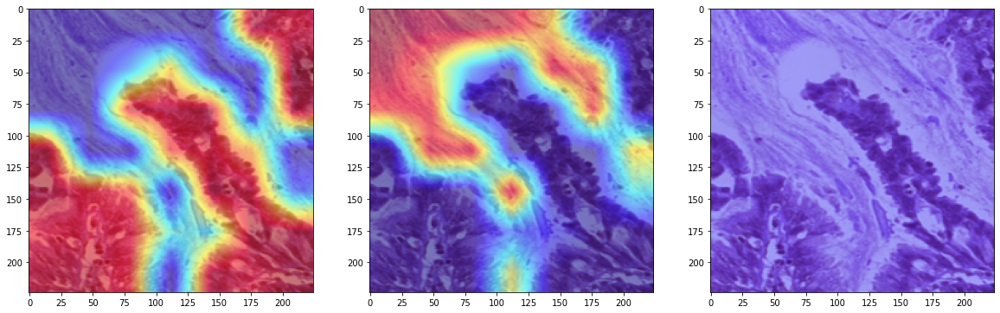

In [20]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 3, 1)
plt.imshow(show_cam_on_image(valid_img_1/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 2)
plt.imshow(show_cam_on_image(valid_img_1/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 3)
plt.imshow(show_cam_on_image(valid_img_1/255, valid_cam_2[0, :], use_rgb=True))

## Cam Refine with PAR

In [24]:
par.to(device)

PAR()

In [25]:
mask = par(valid_img_1_tensor, transforms.ToTensor()(valid_cam_0[0, :]).unsqueeze(0))

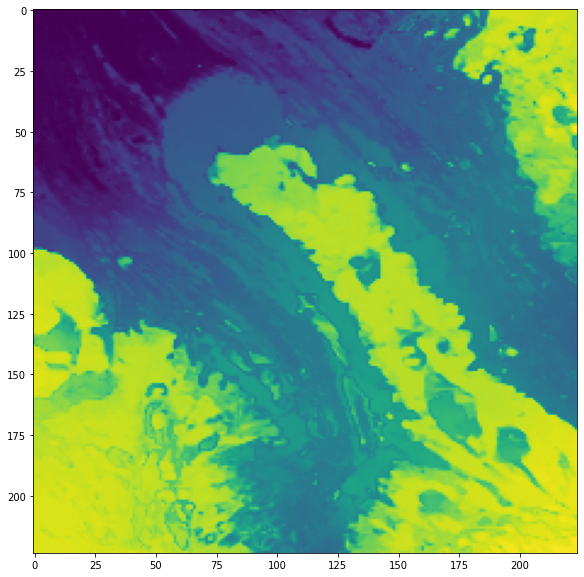

In [26]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask.squeeze(0).squeeze(0))

In [28]:
t = mask.squeeze(0).squeeze(0).cpu().detach().numpy()
t.shape

(224, 224)

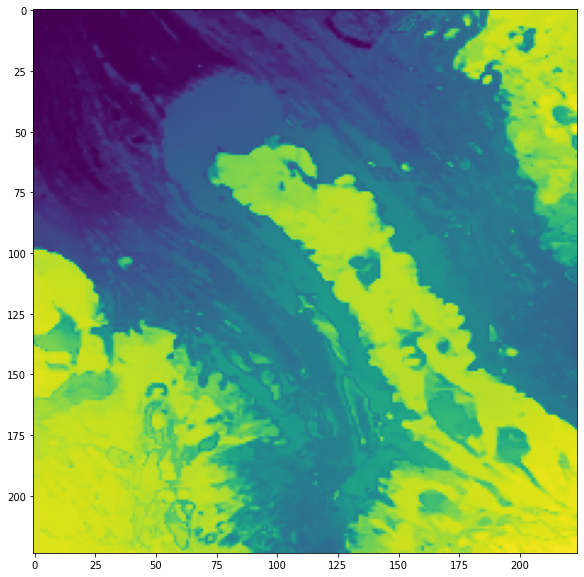

In [29]:
test = minmax_scale(t.reshape(-1, 1))
test = test.reshape(224, 224)

fig = plt.figure(figsize=(10, 10))
plt.imshow(test)

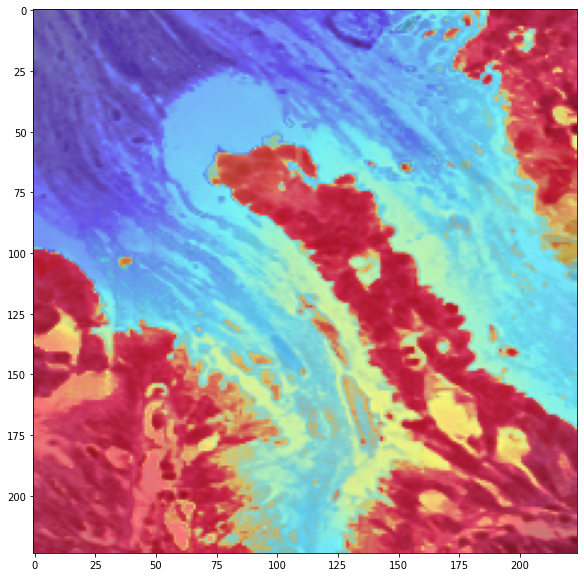

In [32]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_1/255, test, use_rgb=True))

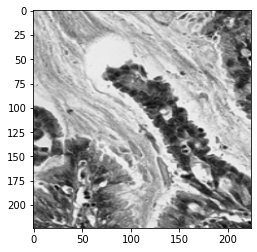

In [33]:
gray = cv2.cvtColor(valid_img_1, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')

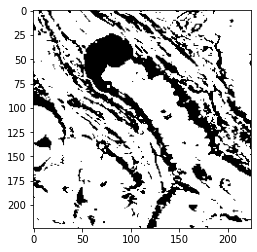

In [34]:
ret, thresh = cv2.threshold(gray, 210, 255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh, cmap='gray')

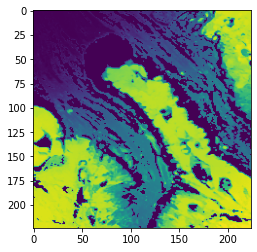

In [35]:
mask_bg_rem = test.reshape(224, 224)*thresh
plt.imshow(mask_bg_rem)

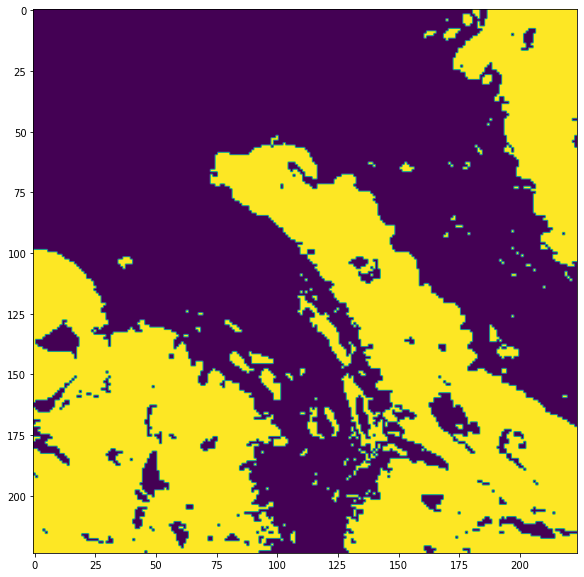

In [37]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask_threshold(mask_bg_rem))

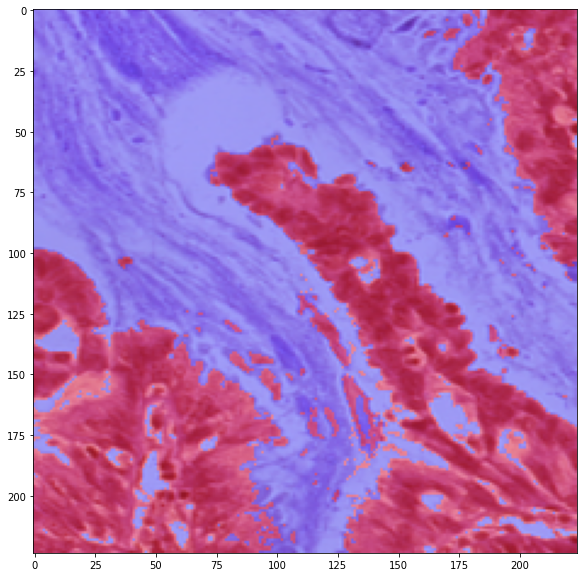

In [39]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_1/255, mask_threshold(mask_bg_rem), use_rgb=True))

# Gradcam: img 2

In [16]:
valid_cam_0 = cam(input_tensor=valid_img_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

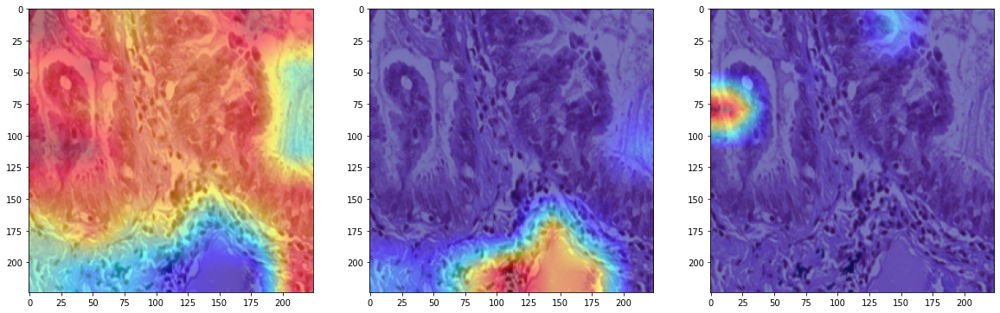

In [17]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 3, 1)
plt.imshow(show_cam_on_image(valid_img_2/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 2)
plt.imshow(show_cam_on_image(valid_img_2/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 3)
plt.imshow(show_cam_on_image(valid_img_2/255, valid_cam_2[0, :], use_rgb=True))

## Cam Refine with PAR

In [18]:
par.to(device)

PAR()

In [19]:
mask1 = par(valid_img_2_tensor, transforms.ToTensor()(valid_cam_0[0, :]).unsqueeze(0))
mask2 = par(valid_img_2_tensor, transforms.ToTensor()(valid_cam_1[0, :]).unsqueeze(0))

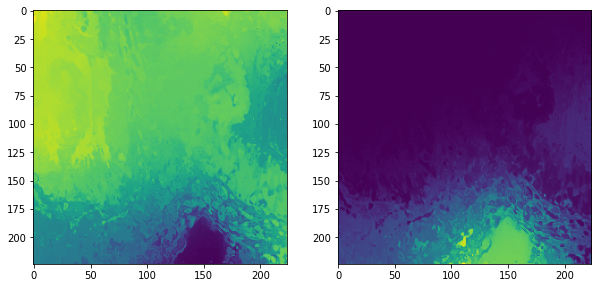

In [20]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(mask1.squeeze(0).squeeze(0))

ax = fig.add_subplot(1, 2, 2)
plt.imshow(mask2.squeeze(0).squeeze(0))

In [21]:
t1 = mask1.squeeze(0).squeeze(0).cpu().detach().numpy()
t2 = mask2.squeeze(0).squeeze(0).cpu().detach().numpy()

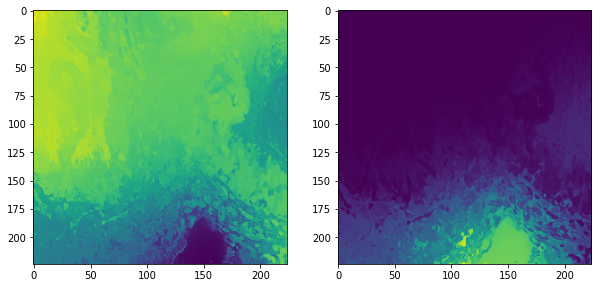

In [22]:
test1 = minmax_scale(t1.reshape(-1, 1))
test1 = test1.reshape(224, 224)

test2 = minmax_scale(t2.reshape(-1, 1))
test2 = test2.reshape(224, 224)

fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(test1)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(test2)

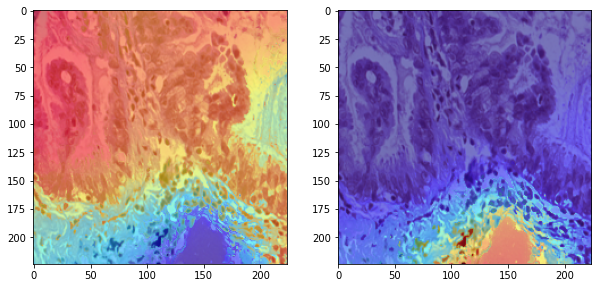

In [23]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(show_cam_on_image(valid_img_2/255, test1, use_rgb=True))

ax = fig.add_subplot(1, 2, 2)
plt.imshow(show_cam_on_image(valid_img_2/255, test2, use_rgb=True))

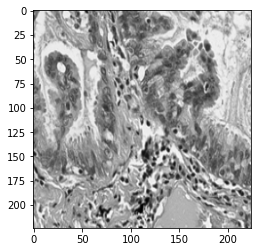

In [24]:
gray = cv2.cvtColor(valid_img_2, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')

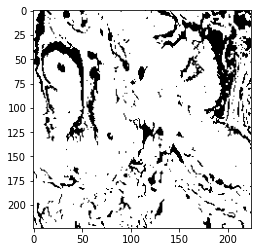

In [25]:
ret, thresh = cv2.threshold(gray, 210, 255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh, cmap='gray')

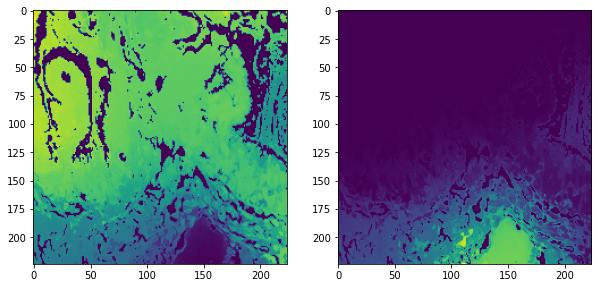

In [26]:
mask_bg_rem1 = test1.reshape(224, 224)*thresh
mask_bg_rem2 = test2.reshape(224, 224)*thresh

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 2, 1)
plt.imshow(mask_bg_rem1)

ax = fig.add_subplot(1, 2, 2)
plt.imshow(mask_bg_rem2)

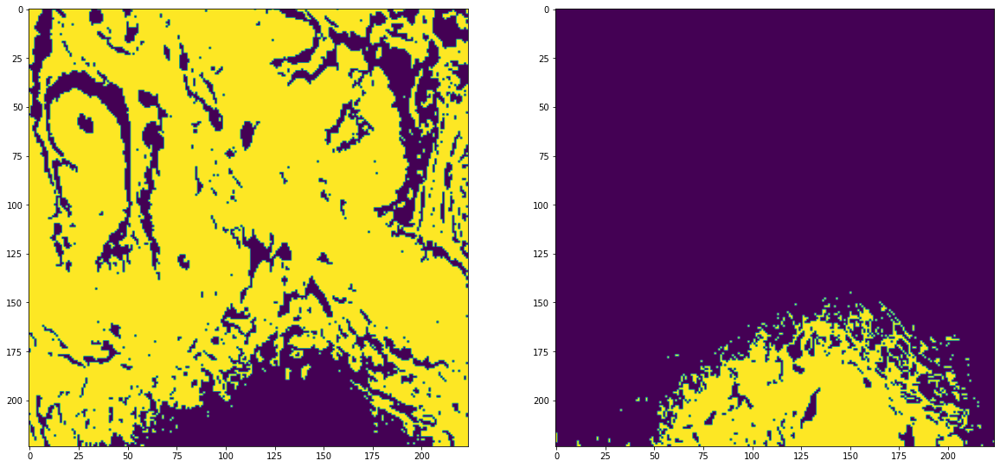

In [27]:
fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(mask_threshold(mask_bg_rem1))

ax = fig.add_subplot(1, 2, 2)
plt.imshow(mask_threshold(mask_bg_rem2))

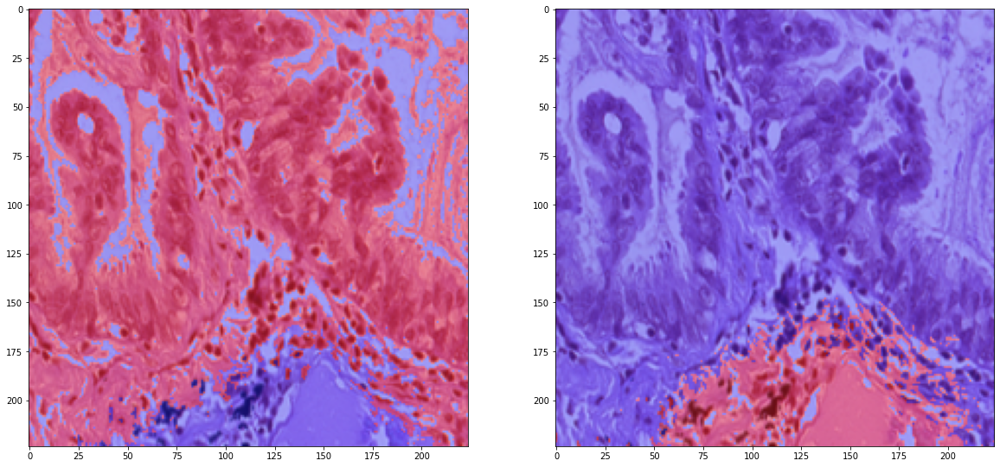

In [28]:
fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(show_cam_on_image(valid_img_2/255, mask_threshold(mask_bg_rem1), use_rgb=True))

ax = fig.add_subplot(1, 2, 2)
plt.imshow(show_cam_on_image(valid_img_2/255, mask_threshold(mask_bg_rem2), use_rgb=True))

## GradCAM: img 3

In [31]:
valid_cam_0 = cam(input_tensor=valid_img_3_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_3_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_3_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

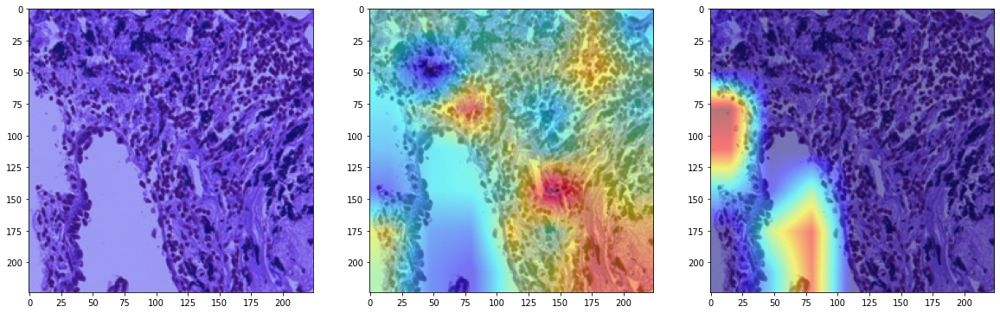

In [32]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 3, 1)
plt.imshow(show_cam_on_image(valid_img_3/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 2)
plt.imshow(show_cam_on_image(valid_img_3/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 3)
plt.imshow(show_cam_on_image(valid_img_3/255, valid_cam_2[0, :], use_rgb=True))

## Cam Refine with PAR

In [33]:
par.to(device)

PAR()

In [34]:
mask = par(valid_img_3_tensor, transforms.ToTensor()(valid_cam_1[0, :]).unsqueeze(0))

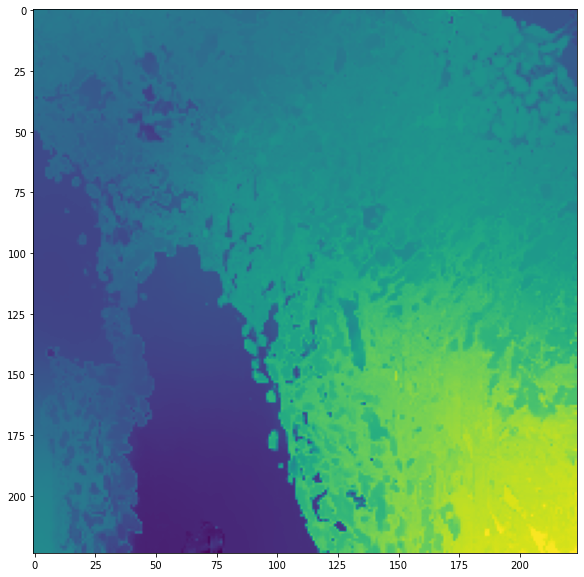

In [35]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask.squeeze(0).squeeze(0))

In [36]:
t = mask.squeeze(0).squeeze(0).cpu().detach().numpy()
t.shape

(224, 224)

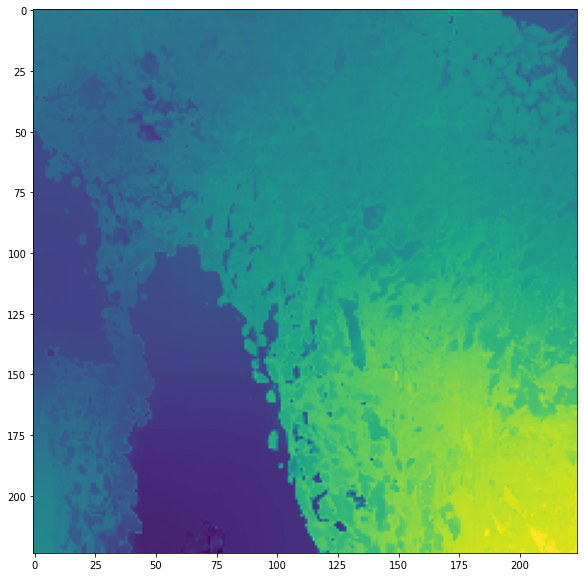

In [37]:
test = minmax_scale(t.reshape(-1, 1))
test = test.reshape(224, 224)

fig = plt.figure(figsize=(10, 10))
plt.imshow(test)

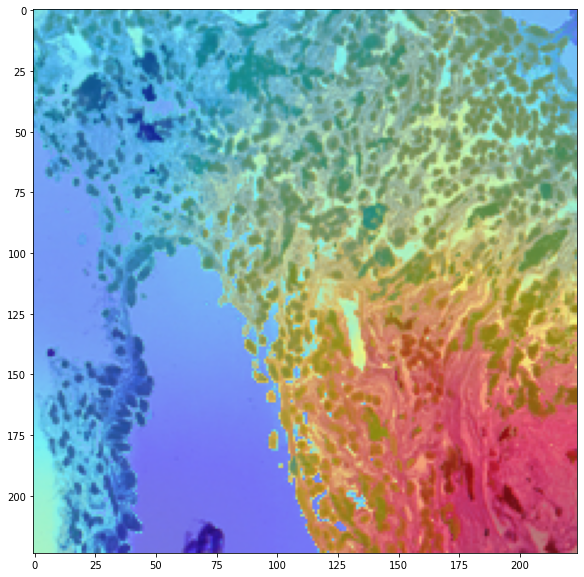

In [38]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_3/255, test, use_rgb=True))

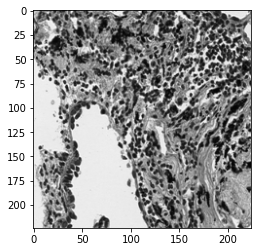

In [39]:
gray = cv2.cvtColor(valid_img_3, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')

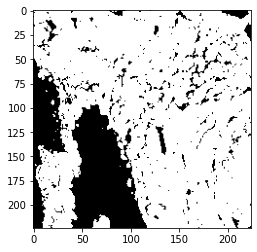

In [40]:
ret, thresh = cv2.threshold(gray, 210, 255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh, cmap='gray')

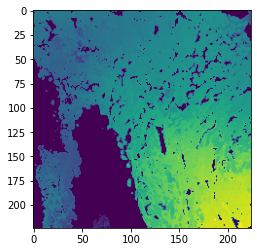

In [41]:
mask_bg_rem = test.reshape(224, 224)*thresh
plt.imshow(mask_bg_rem)

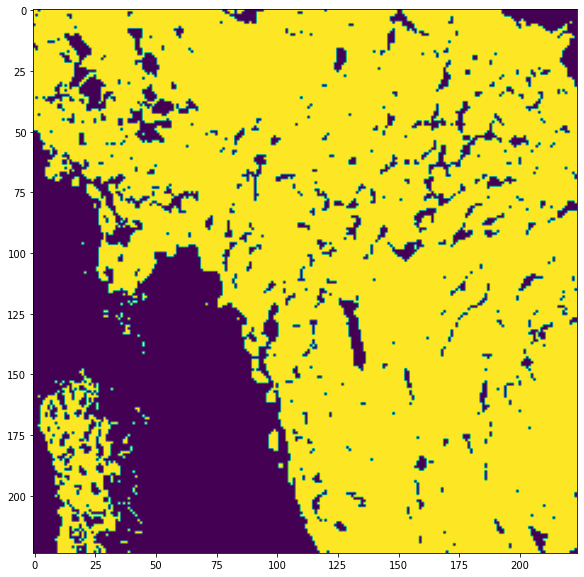

In [42]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask_threshold(mask_bg_rem))

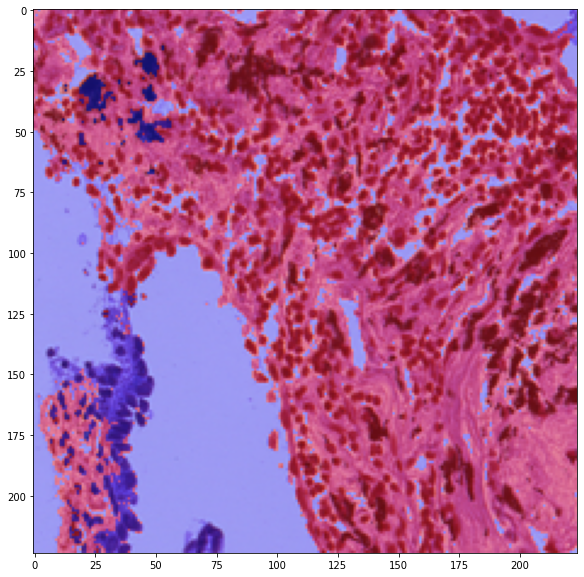

In [43]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_3/255, mask_threshold(mask_bg_rem), use_rgb=True))

## GradCAM: img 4

In [44]:
valid_cam_0 = cam(input_tensor=valid_img_4_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
valid_cam_1 = cam(input_tensor=valid_img_4_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
valid_cam_2 = cam(input_tensor=valid_img_4_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

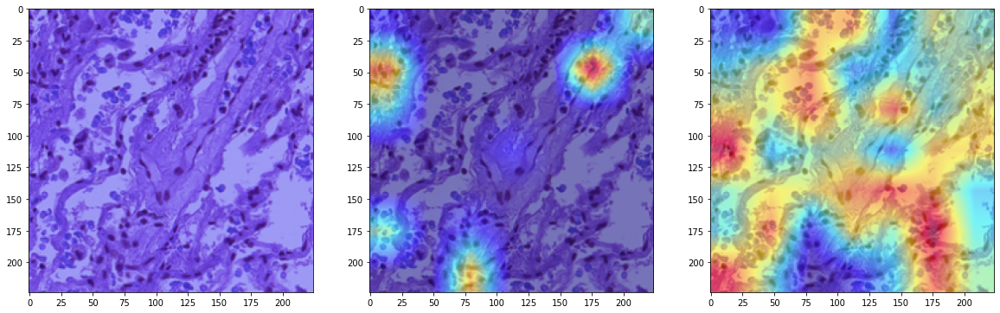

In [45]:
fig = plt.figure(figsize=(20, 40))
'''
ax = fig.add_subplot(1, 4, 1)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 2)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 3)
plt.imshow(valid_img)

ax = fig.add_subplot(1, 4, 4)
plt.imshow(valid_img)
'''
ax = fig.add_subplot(1, 3, 1)
plt.imshow(show_cam_on_image(valid_img_4/255, valid_cam_0[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 2)
plt.imshow(show_cam_on_image(valid_img_4/255, valid_cam_1[0, :], use_rgb=True))

ax = fig.add_subplot(1, 3, 3)
plt.imshow(show_cam_on_image(valid_img_4/255, valid_cam_2[0, :], use_rgb=True))

## Cam Refine with PAR

In [ ]:
par.to(device)

PAR()

In [48]:
mask = par(valid_img_4_tensor, transforms.ToTensor()(valid_cam_2[0, :]).unsqueeze(0))

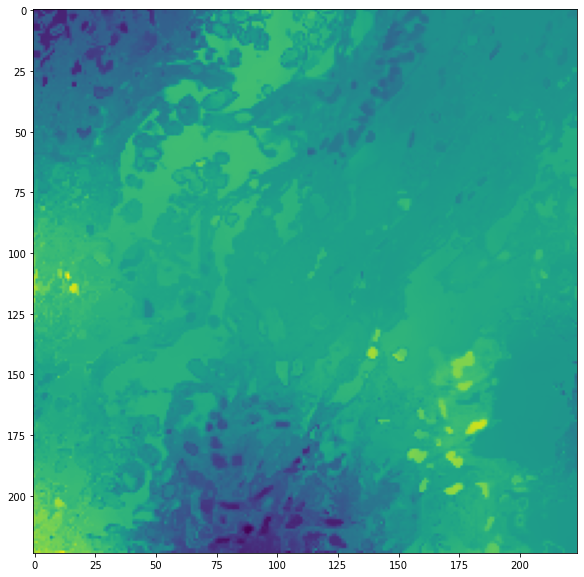

In [49]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask.squeeze(0).squeeze(0))

In [50]:
t = mask.squeeze(0).squeeze(0).cpu().detach().numpy()
t.shape

(224, 224)

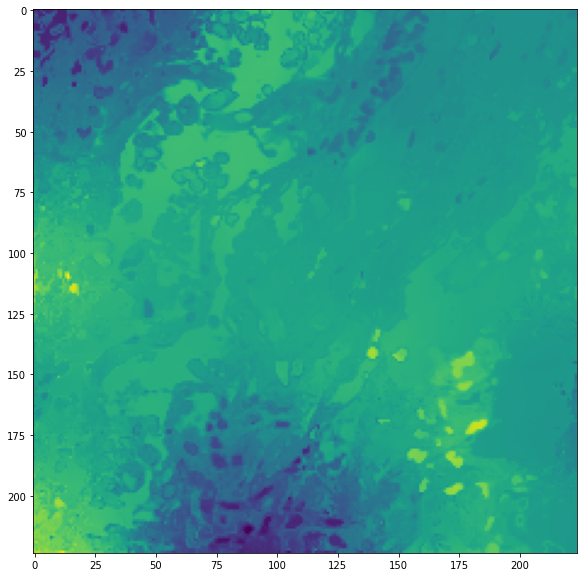

In [51]:
test = minmax_scale(t.reshape(-1, 1))
test = test.reshape(224, 224)

fig = plt.figure(figsize=(10, 10))
plt.imshow(test)

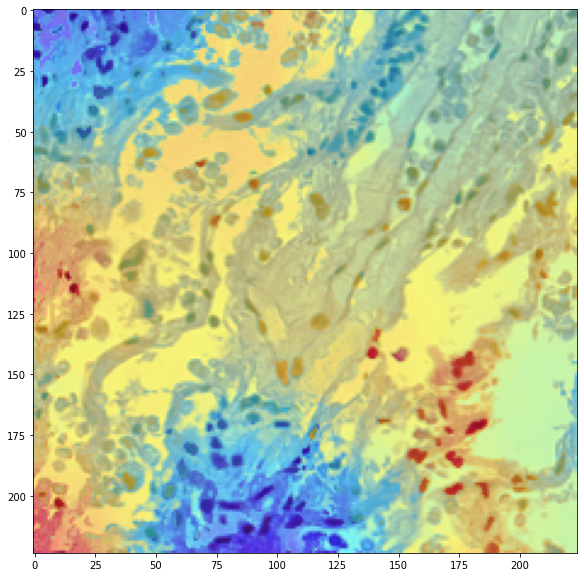

In [52]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_4/255, test, use_rgb=True))

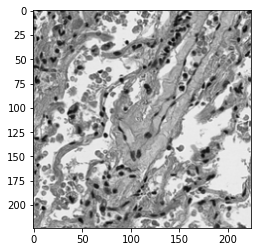

In [54]:
gray = cv2.cvtColor(valid_img_4, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')

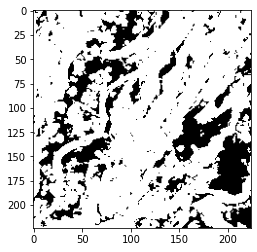

In [55]:
ret, thresh = cv2.threshold(gray, 210, 255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh, cmap='gray')

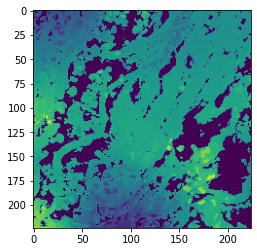

In [56]:
mask_bg_rem = test.reshape(224, 224)*thresh
plt.imshow(mask_bg_rem)

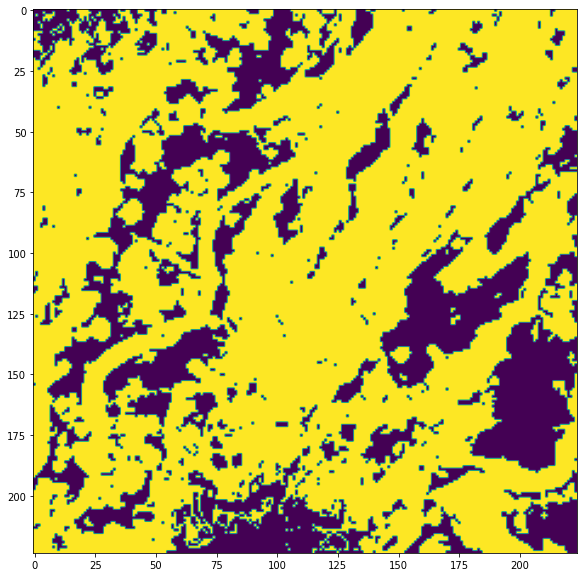

In [57]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(mask_threshold(mask_bg_rem))

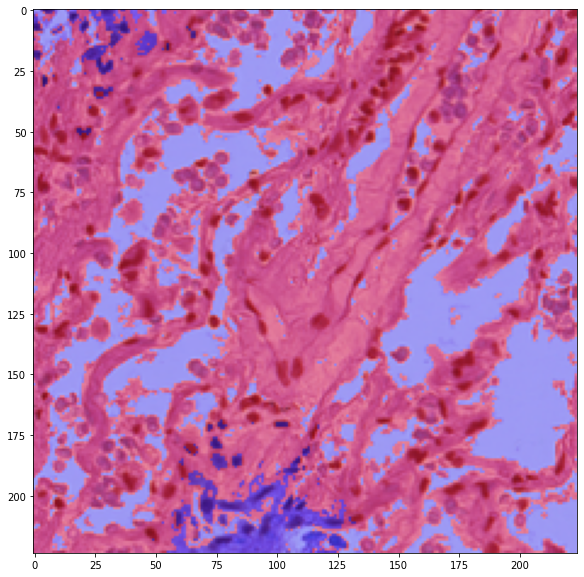

In [58]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(show_cam_on_image(valid_img_4/255, mask_threshold(mask_bg_rem), use_rgb=True))